- Sobhan Moradian Daghigh
- 5/30/2022
- DIP - HW03 - Q4

In [2]:
import numpy as np
from matplotlib import pyplot as plt
import cv2
import glob

In [3]:
def load_datas(folder_name):
    images = []
    names = []
    folders = glob.glob(folder_name)[0]
    files = glob.glob('{}/**/*.png'.format(folders))
    for file in files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        name = file.split('\\')[-1][:-4]
        folder = file.split('\\')[-2]
        print('   |_ folder {}  ->  {:<20s} loaded.'.format(folder, name))
        
        images.append(img)
        names.append(name)               
    return images, names

In [108]:
images, names = load_datas('./inputs/P4/')

   |_ folder a  ->  diagonal_gird        loaded.
   |_ folder a  ->  dot_grid             loaded.
   |_ folder a  ->  orthogonal_lines     loaded.
   |_ folder b  ->  cagi_1               loaded.
   |_ folder b  ->  cagi_2               loaded.
   |_ folder b  ->  cagi_3               loaded.
   |_ folder c  ->  munker_hearts        loaded.
   |_ folder c  ->  munker_spheres_1     loaded.
   |_ folder c  ->  munker_spheres_2     loaded.
   |_ folder c  ->  munker_zigzag_lines  loaded.
   |_ folder c  ->  parallel-lines       loaded.
   |_ folder d  ->  munker_cubes         loaded.
   |_ folder d  ->  munker_hears_2       loaded.
   |_ folder d  ->  munker_monspiral     loaded.


### Functions.

In [5]:
def rgb2hsv(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
def hsv2rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_HSV2RGB)

def rgb2ycbcr(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    
def ycbcr2rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_YCrCb2RGB)

def rgb2lab(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    
def lab2rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_Lab2RGB)

In [6]:
def plotter(images, names=None, subplots=None, gray=False):
    if subplots is None:
        plt.imshow(images, cmap='gray') if gray else plt.imshow(images)
        plt.title(names)
        plt.axis('off')
    else:
        fig, ax = plt.subplots(subplots[0], subplots[1], figsize=(subplots[1] * 5, subplots[0] * 5))
        for i, (img, name, ax) in enumerate(zip(images, names, fig.axes)):
            ax.imshow(img, cmap='gray') if gray else ax.imshow(img)
            ax.set_title(name)
            ax.axis('off')
    plt.show()

In [83]:
def fourier_transform(img):
    fft = np.fft.fft2(img)
    fft_shift = np.fft.fftshift(fft)
    magnitude_spectrum = 20 * np.log(np.abs(fft_shift))
    return magnitude_spectrum, fft_shift

In [44]:
def inverse_fourier_transform(img):
    ifft = np.fft.ifftshift(img)
    ifft = np.fft.ifft2(ifft)
    inversed = (np.abs(ifft)).astype(np.uint8)
    return inversed

In [266]:
# Automatic filtering

def auto_bandpass_filtering(img, threshold, line_filter=False):
    img = img.copy()
    points = []
    crow, ccol = np.array(img.shape) // 2
    margin = 17
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if line_filter:
                if not i in range(crow - margin, crow + margin) and not j in range(ccol - margin, ccol + margin):
                    if np.linalg.norm(img[i, j]) > threshold:
                        points.append([j, i])

            else:
                if not (i in range(crow - margin, crow + margin) and j in range(ccol - margin, ccol + margin)):
                    if np.linalg.norm(img[i, j]) > threshold:
                        points.append([j, i])
    return points

In [10]:
def mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
#         print('  |_ ({}, {})'.format(x, y))
        param[1].append([x, y])
        cv2.destroyWindow("Choose")
        param[0] = bandpass_filtering(param[0], param[1])
        select_noises(param[0], '', param[1])

In [37]:
def select_noises(img, img_name, points):
#     print('The selected center point for filtering [{}] is:'.format(img_name))
    cv2.imshow('Choose', normalizer(img))
    cv2.setMouseCallback('Choose', mouse_click, [img, points])
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [468]:
def bandpass_filtering(img, points):
    for point in points:
        w_size = 3
        i, j = point[1], point[0]
        img[i-w_size:i+w_size, j-w_size:j+w_size] = 0
    return img

In [38]:
def convert_color_space(img, color_space, dst='rgb'):
    if dst == 'rgb':
        if color_space == 'HSV':
            new_img = hsv2rgb(img)
        elif color_space == 'YCbCr':
            new_img = ycbcr2rgb(img)
        elif color_space == 'Lab':
            new_img = lab2rgb(img)
        else: 
            new_img = img
            
    else:
        if color_space == 'HSV':
            new_img = rgb2hsv(img)
        elif color_space == 'YCbCr':
            new_img = rgb2ycbcr(img)
        elif color_space == 'Lab':
            new_img = rgb2lab(img)
        else:
            new_img = img
    
    return new_img

In [24]:
def normalizer(img):
    maximum = img.max()
    minimum = img.min()
    return ((img - minimum) / (maximum - minimum) * 255).astype(np.uint8)

### Part A.

| Color Space: RGB-------------------------------------------------------------------------------------------------

   |_ image: diagonal_gird


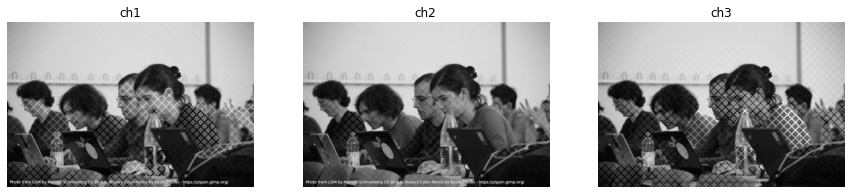

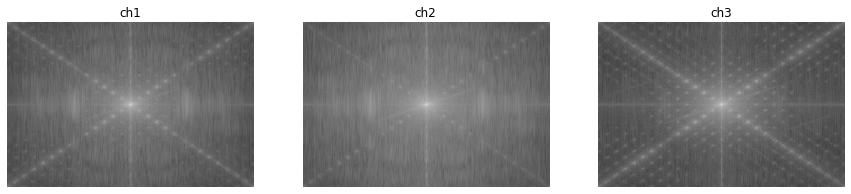

   |_ image: dot_grid


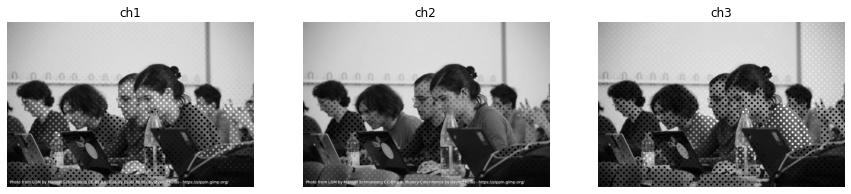

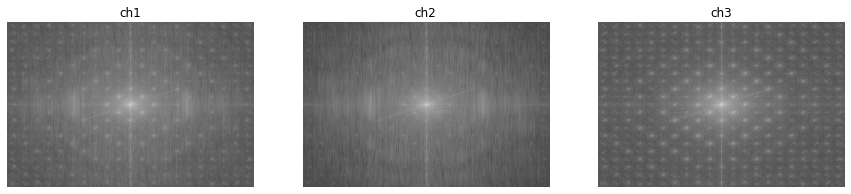

   |_ image: orthogonal_lines


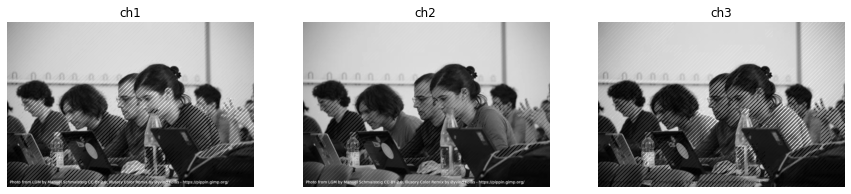

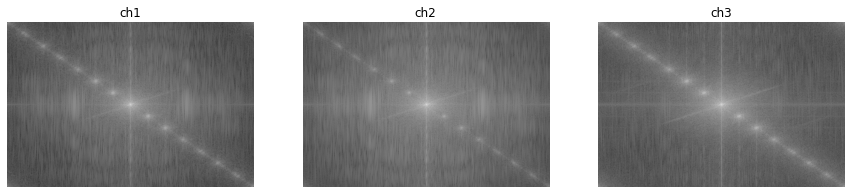

| Color Space: HSV-------------------------------------------------------------------------------------------------

   |_ image: diagonal_gird


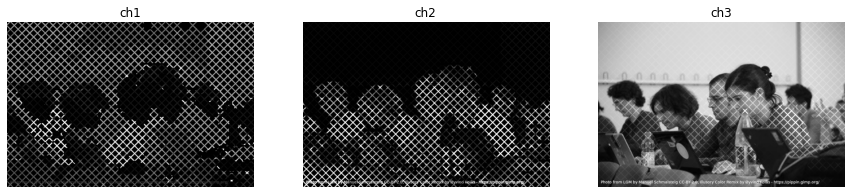

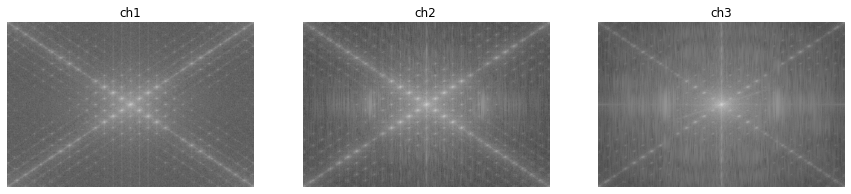

   |_ image: dot_grid


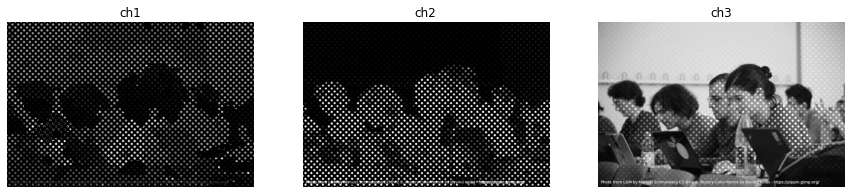

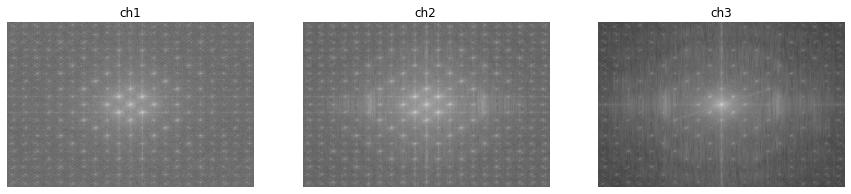

   |_ image: orthogonal_lines


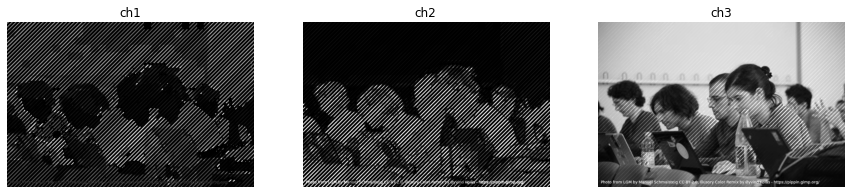

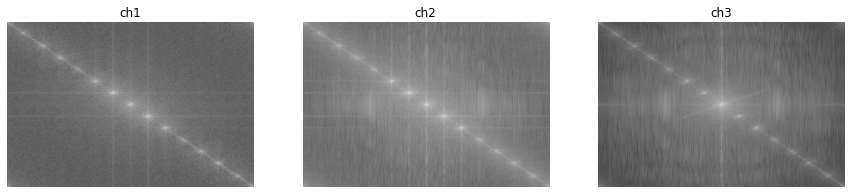

| Color Space: YCbCr-----------------------------------------------------------------------------------------------

   |_ image: diagonal_gird


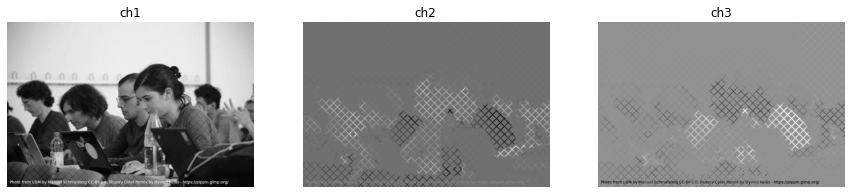

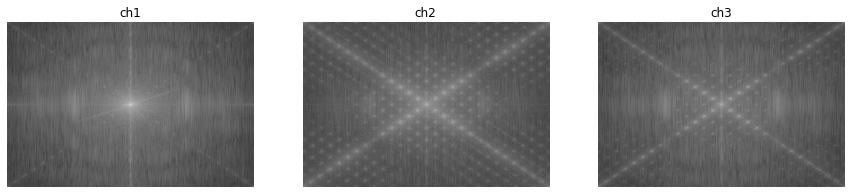

   |_ image: dot_grid


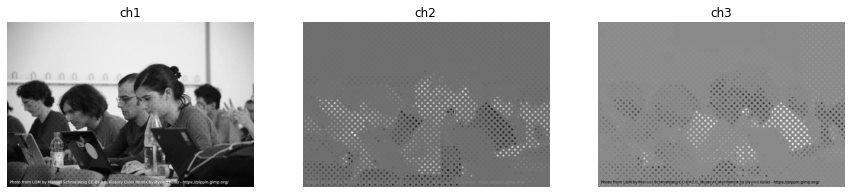

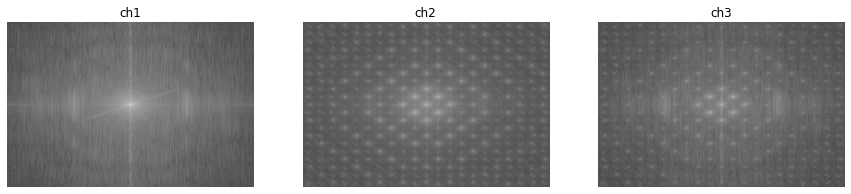

   |_ image: orthogonal_lines


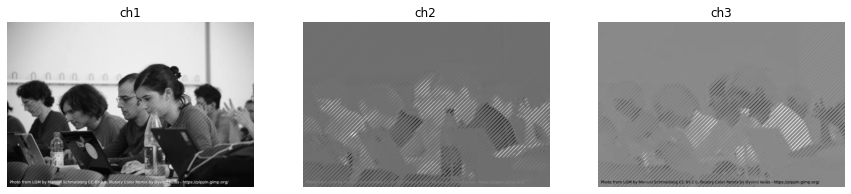

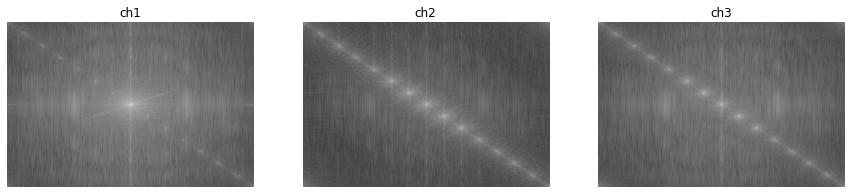

| Color Space: Lab-------------------------------------------------------------------------------------------------

   |_ image: diagonal_gird


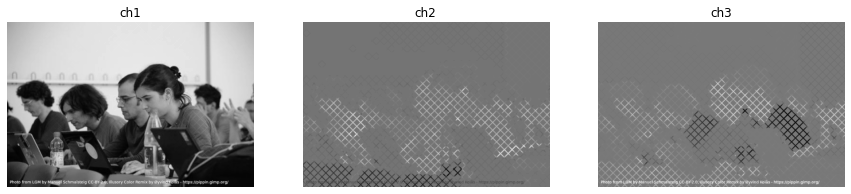

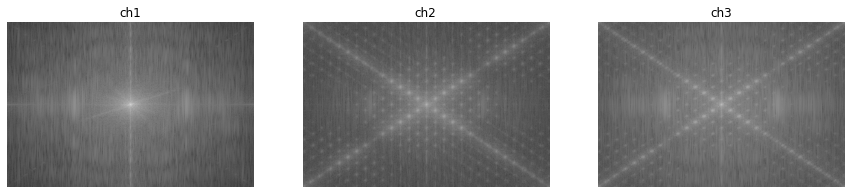

   |_ image: dot_grid


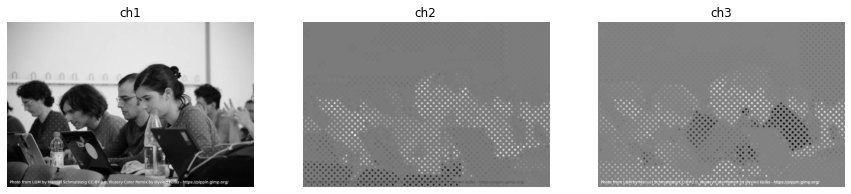

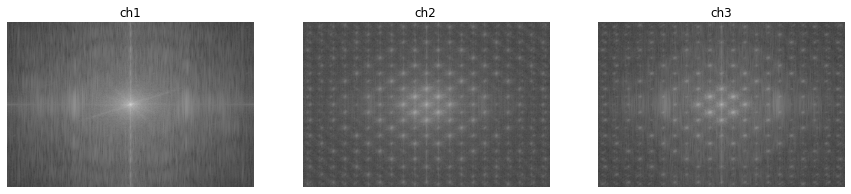

   |_ image: orthogonal_lines


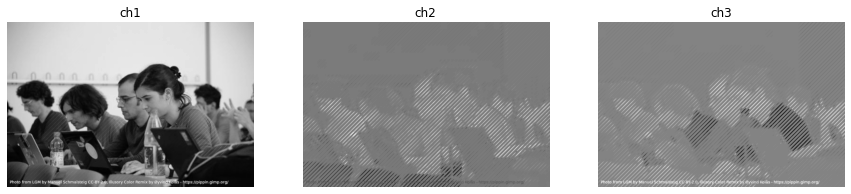

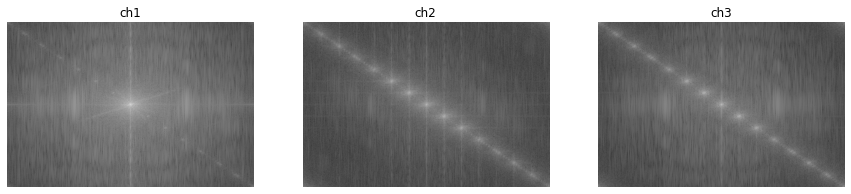

In [53]:
color_spaces = ['RGB', 'HSV', 'YCbCr', 'Lab']
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[:3]):
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        for channel in channels:
            magnitude_spectrum, _ = fourier_transform(channel)
            magnitudes.append(magnitude_spectrum)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)    

### Part B.

| Color Space: Lab-------------------------------------------------------------------------------------------------

   |_ image: cagi_1


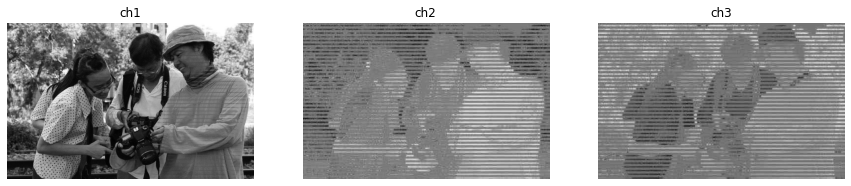

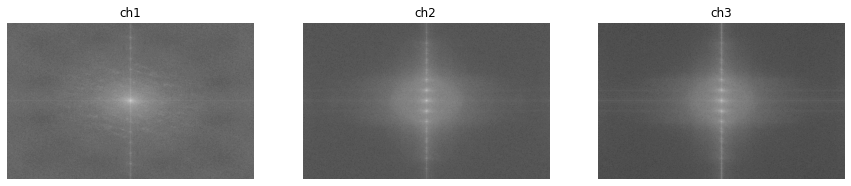

   |_ image: cagi_2


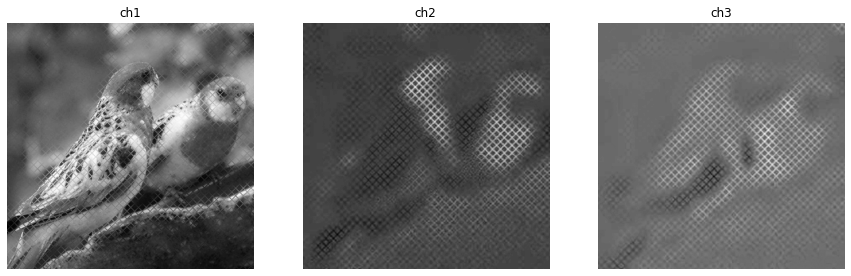

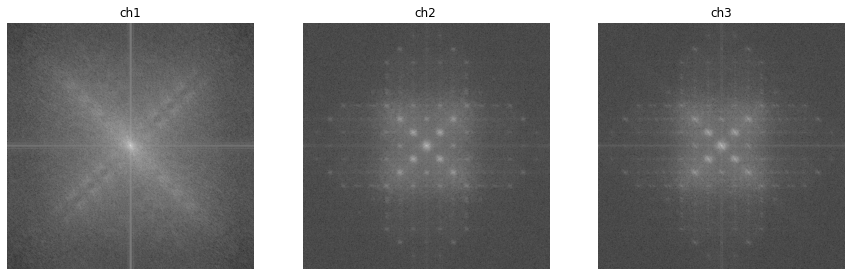

   |_ image: cagi_3


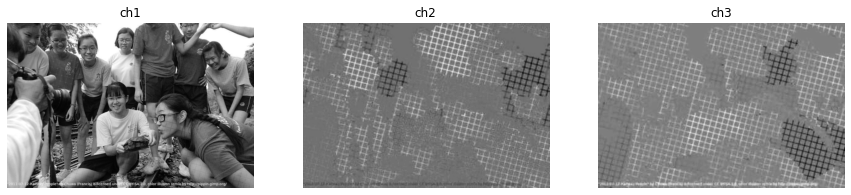

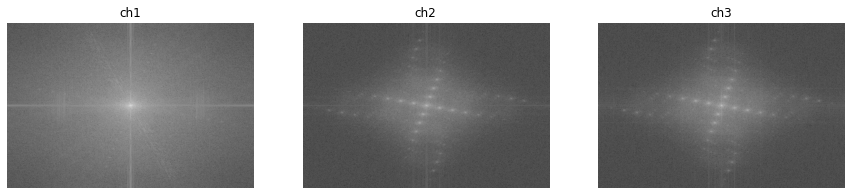

In [60]:
color_spaces = ['Lab'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[3:6]):
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        for channel in channels:
            magnitude_spectrum, mag = fourier_transform(channel)
            magnitudes.append(magnitude_spectrum)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)

#### Filtering 1 image as an example:

| Color Space: YCbCr-----------------------------------------------------------------------------------------------

   |_ image: cagi_1


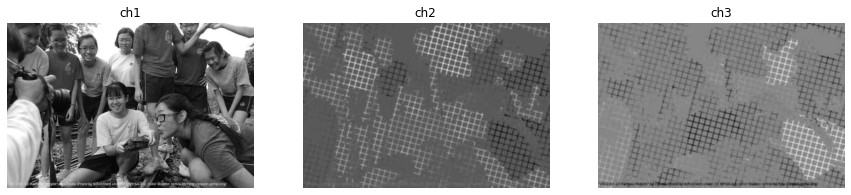

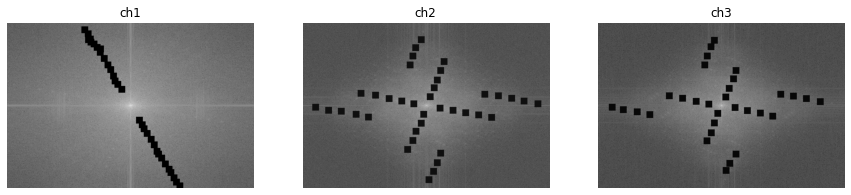

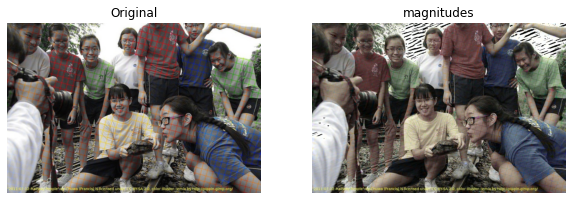

In [75]:
color_spaces = ['YCbCr'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[5:6]):
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        for channel in channels:
            points = []
            magnitude_spectrum, mag = fourier_transform(channel)
            select_noises(magnitude_spectrum, names[i + 3], points)
            filtered = bandpass_filtering(mag, points)
            backed_img = inverse_fourier_transform(filtered)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, points)
            magnitudes.append(backed_img)
            filtered_show.append(filtered_to_show)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

| Color Space: HSV-------------------------------------------------------------------------------------------------

   |_ image: cagi_1


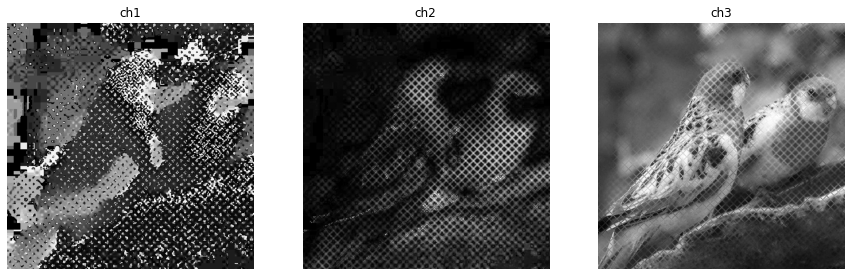

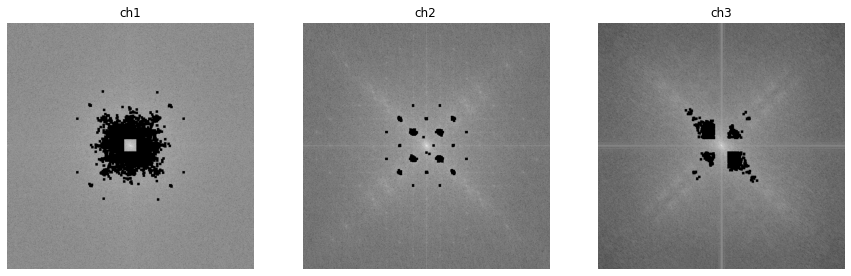

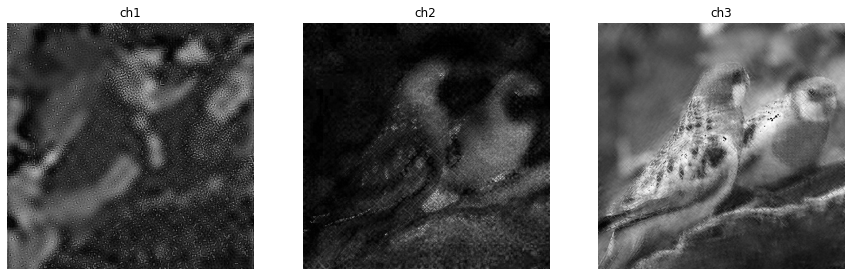

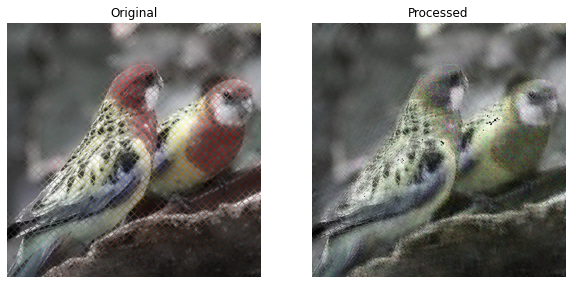

In [532]:
color_spaces = ['HSV'] #'RGB', 'HSV', 'YCbCr', 'La'
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[4:5]):
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        thresholds = [100000, 100000, 60000]
        for j, channel in enumerate(channels):
            magnitude_spectrum, mag = fourier_transform(channel)
            filtered_points = auto_bandpass_filtering(mag, threshold=thresholds[j], line_filter=[False, False, True][j])
            filtered = bandpass_filtering(mag, filtered_points)
            backed_img = inverse_fourier_transform(filtered)
            magnitudes.append(backed_img)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, filtered_points)
            filtered_show.append(magnitude_spectrum)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
                
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')
        plotter([img, backed.astype(np.uint8)], names=['Original', 'Processed'], subplots=(1, 2))

| Color Space: HSV-------------------------------------------------------------------------------------------------

   |_ image: cagi_1


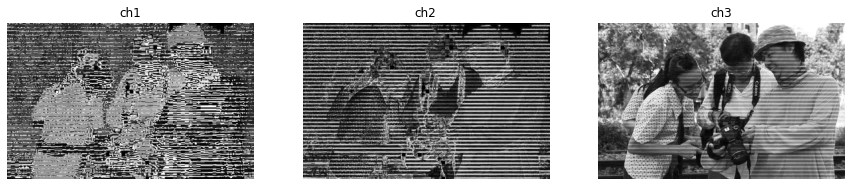

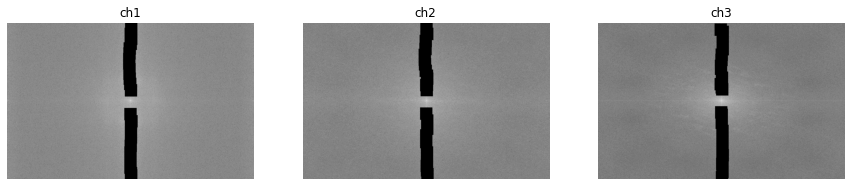

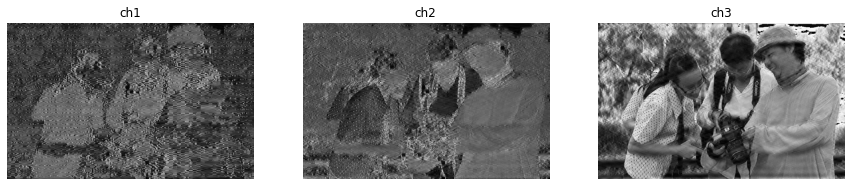

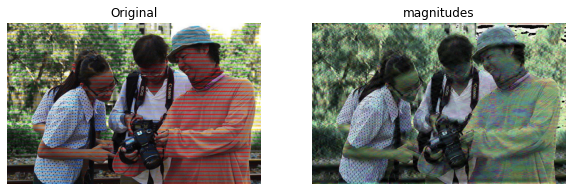

In [332]:
color_spaces = ['HSV'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[3:4]):
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        for channel in channels:
            points = []
            magnitude_spectrum, mag = fourier_transform(channel)
            select_noises(magnitude_spectrum, names[i + 3], points)
            filtered = bandpass_filtering(mag, points)
            backed_img = inverse_fourier_transform(filtered)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, points)
            magnitudes.append(backed_img)
            filtered_show.append(filtered_to_show)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

### Part C.

| Color Space: YCbCr-----------------------------------------------------------------------------------------------

   |_ image: cagi_1


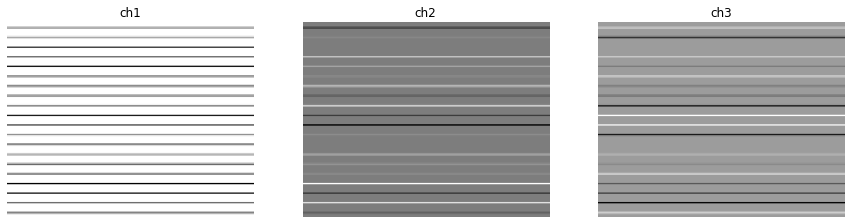

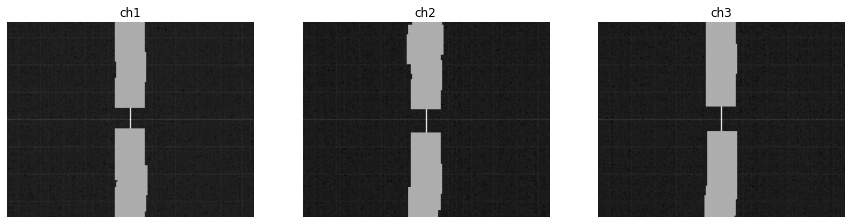

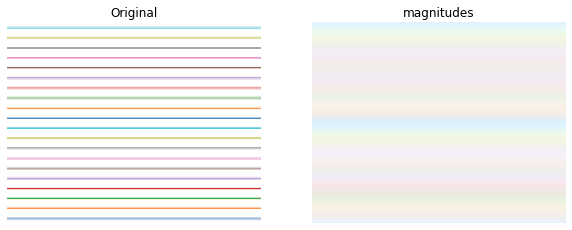

In [110]:
color_spaces = ['YCbCr'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[10:11]):
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        for channel in channels:
            points = []
            magnitude_spectrum, mag = fourier_transform(channel)
            select_noises(magnitude_spectrum, names[i + 3], points)
            filtered = bandpass_filtering(mag, points)
            backed_img = inverse_fourier_transform(filtered)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, points)
            magnitudes.append(backed_img)
            filtered_show.append(filtered_to_show)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

| Color Space: YCbCr-----------------------------------------------------------------------------------------------

   |_ image: cagi_1


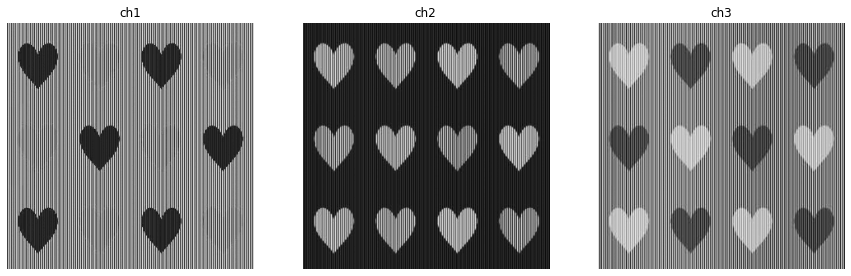

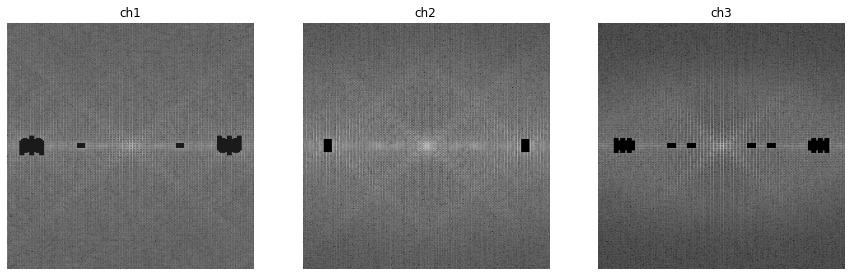

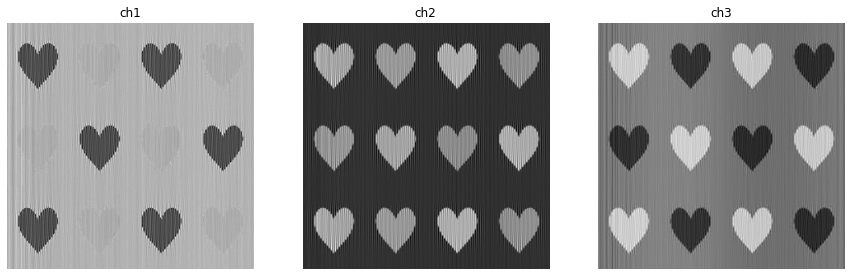

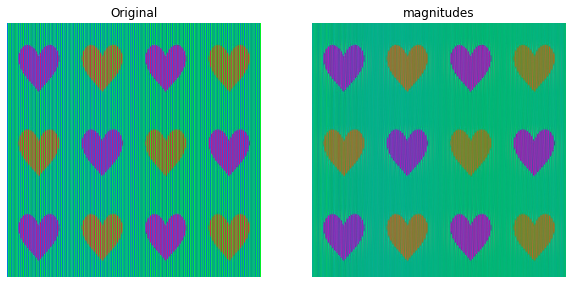

In [456]:
color_spaces = ['YCbCr'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[6:7]):
        img = cv2.resize(img, (300, 300))
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        thresholds = [20000, 115000, 40000]
        for j, channel in enumerate(channels):
            magnitude_spectrum, mag = fourier_transform(channel)
            filtered_points = auto_bandpass_filtering(mag, threshold=thresholds[j], line_filter=[False, False, False][j])
            filtered = bandpass_filtering(mag, filtered_points)
            backed_img = inverse_fourier_transform(filtered)
            magnitudes.append(backed_img)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, filtered_points)
            filtered_show.append(magnitude_spectrum)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

| Color Space: HSV-------------------------------------------------------------------------------------------------

   |_ image: cagi_1


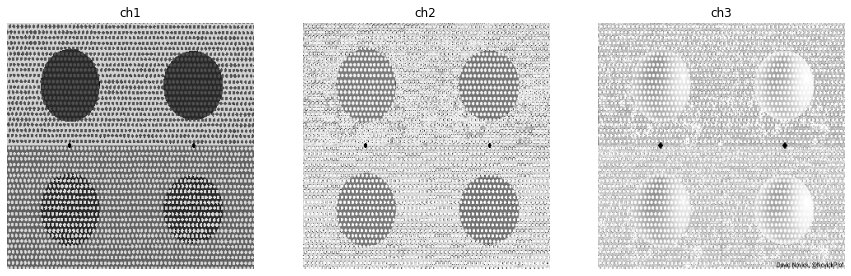

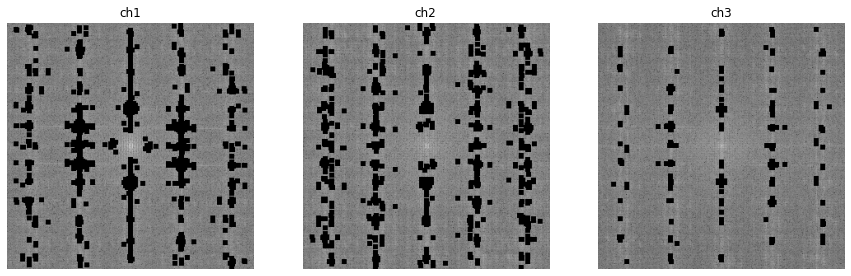

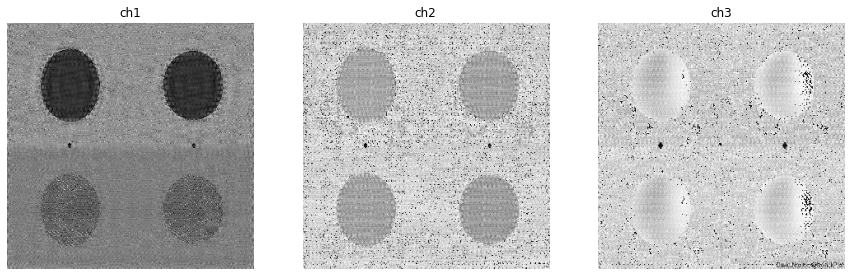

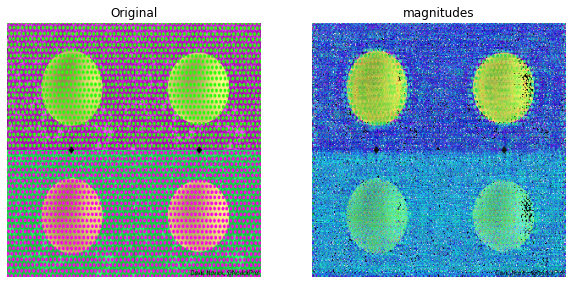

In [487]:
color_spaces = ['HSV'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[8:9]):
        img = cv2.resize(img, (300, 300))
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        thresholds = [25000, 45000, 50000]
        for j, channel in enumerate(channels):
            magnitude_spectrum, mag = fourier_transform(channel)
            filtered_points = auto_bandpass_filtering(mag, threshold=thresholds[j], line_filter=[False, False, False][j])
            filtered = bandpass_filtering(mag, filtered_points)
            backed_img = inverse_fourier_transform(filtered)
            magnitudes.append(backed_img)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, filtered_points)
            filtered_show.append(magnitude_spectrum)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

| Color Space: YCbCr-----------------------------------------------------------------------------------------------

   |_ image: cagi_1


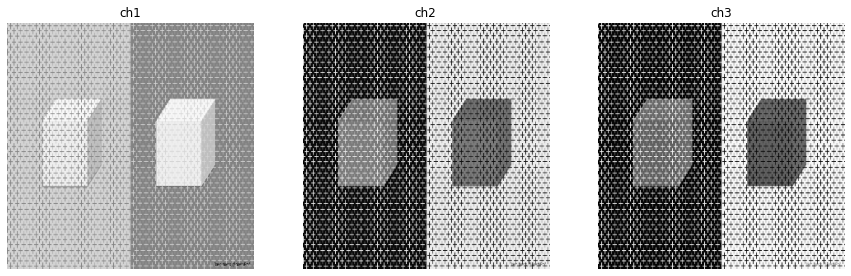

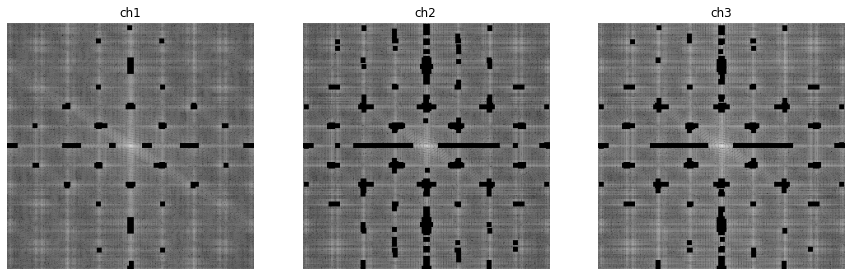

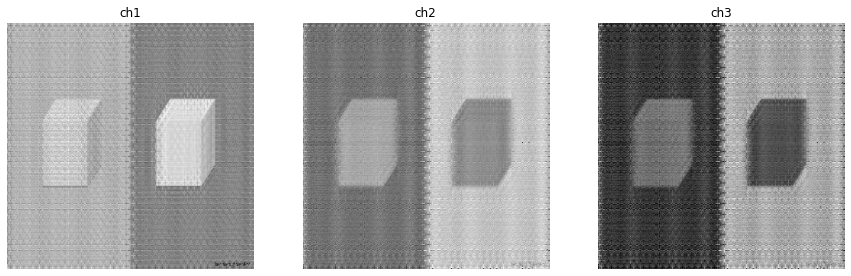

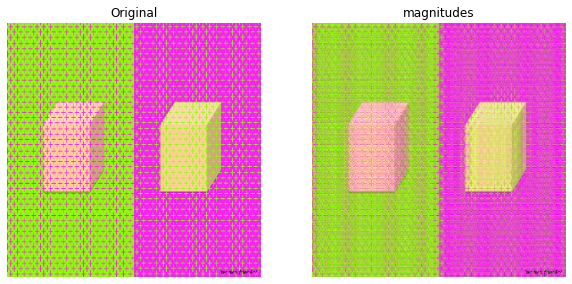

In [526]:
color_spaces = ['YCbCr'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[11:12]):
        img = cv2.resize(img, (300, 300))
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        thresholds = [60000, 50000, 80000]
        for j, channel in enumerate(channels):
            magnitude_spectrum, mag = fourier_transform(channel)
            filtered_points = auto_bandpass_filtering(mag, threshold=thresholds[j], line_filter=[False, False, False][j])
            filtered = bandpass_filtering(mag, filtered_points)
            backed_img = inverse_fourier_transform(filtered)
            magnitudes.append(backed_img)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, filtered_points)
            filtered_show.append(magnitude_spectrum)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

| Color Space: YCbCr-----------------------------------------------------------------------------------------------

   |_ image: cagi_1


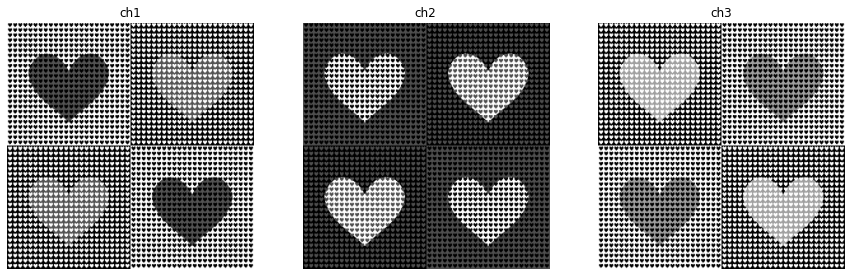

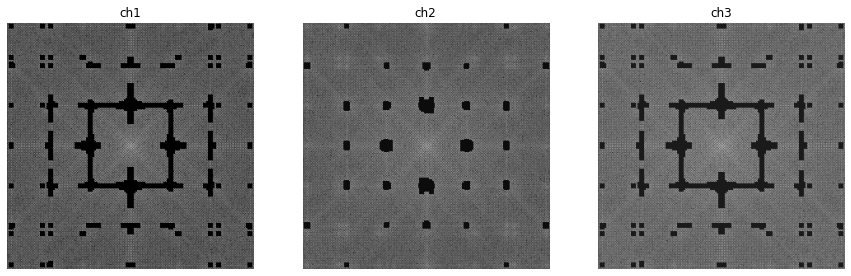

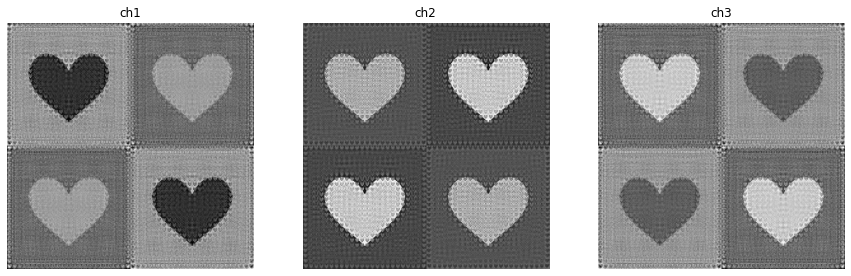

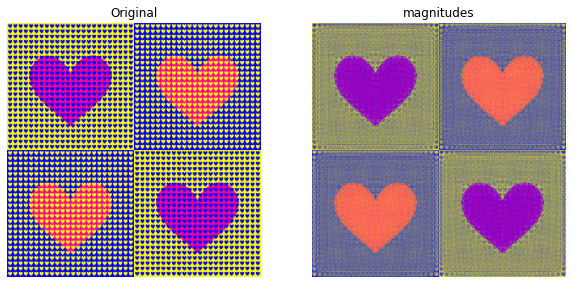

In [527]:
color_spaces = ['YCbCr'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[12:13]):
        img = cv2.resize(img, (300, 300))
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        thresholds = [60000, 50000, 80000]
        for j, channel in enumerate(channels):
            magnitude_spectrum, mag = fourier_transform(channel)
            filtered_points = auto_bandpass_filtering(mag, threshold=thresholds[j], line_filter=[False, False, False][j])
            filtered = bandpass_filtering(mag, filtered_points)
            backed_img = inverse_fourier_transform(filtered)
            magnitudes.append(backed_img)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, filtered_points)
            filtered_show.append(magnitude_spectrum)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

| Color Space: HSV-------------------------------------------------------------------------------------------------

   |_ image: cagi_1


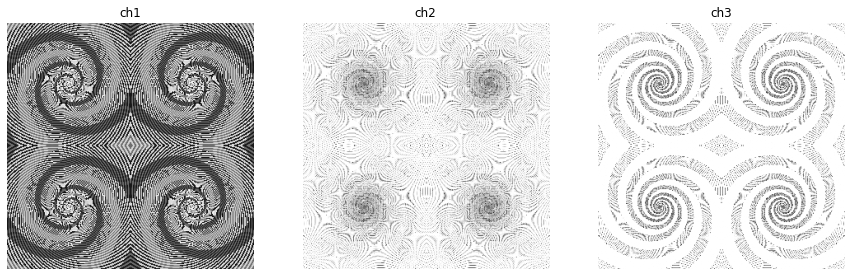

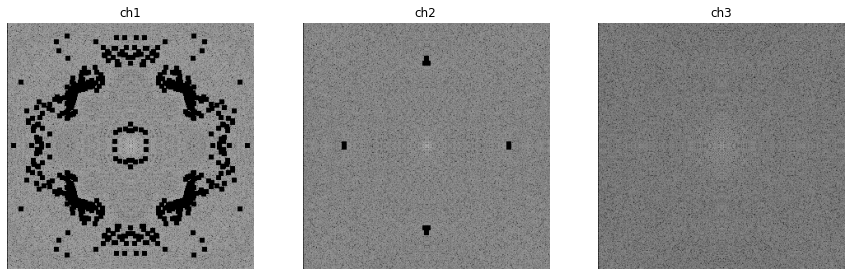

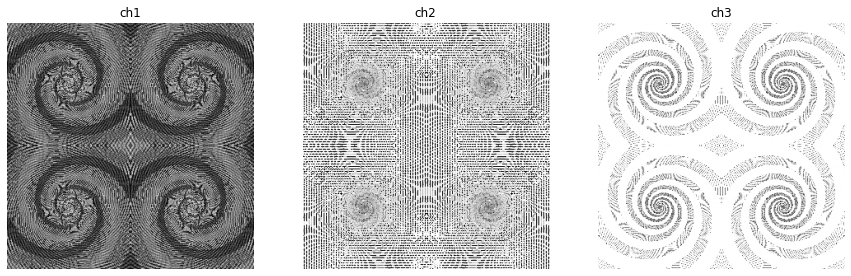

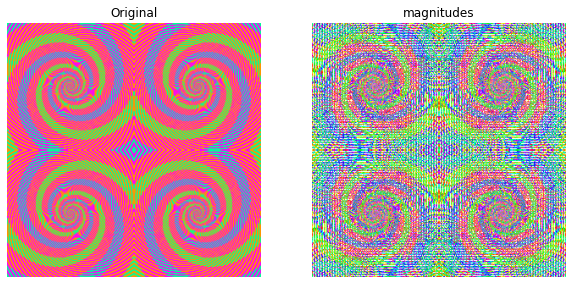

In [531]:
color_spaces = ['HSV'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[13:14]):
        img = cv2.resize(img, (300, 300))
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        thresholds = [60000, 50000, 80000]
        for j, channel in enumerate(channels):
            magnitude_spectrum, mag = fourier_transform(channel)
            filtered_points = auto_bandpass_filtering(mag, threshold=thresholds[j], line_filter=[False, False, False][j])
            filtered = bandpass_filtering(mag, filtered_points)
            backed_img = inverse_fourier_transform(filtered)
            magnitudes.append(backed_img)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, filtered_points)
            filtered_show.append(magnitude_spectrum)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

| Color Space: YCbCr-----------------------------------------------------------------------------------------------

   |_ image: cagi_1


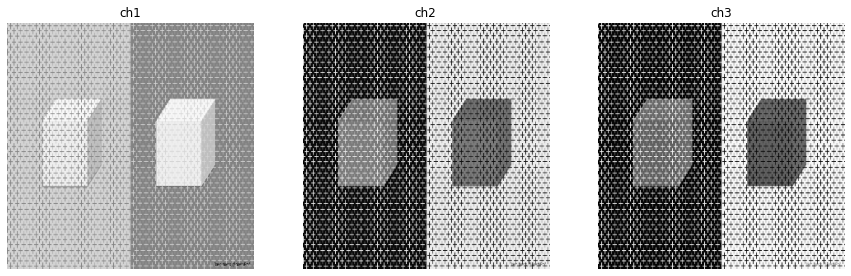

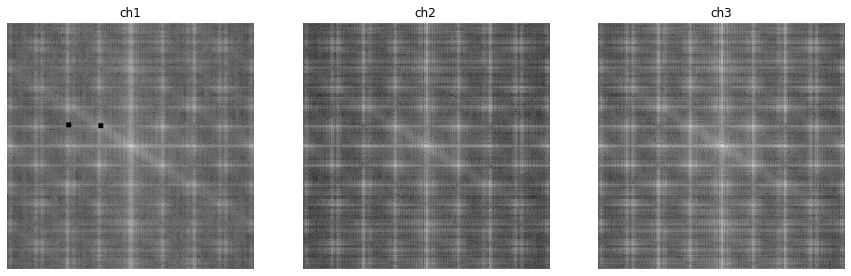

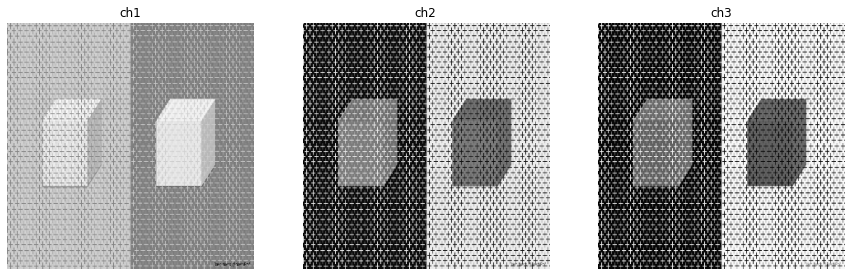

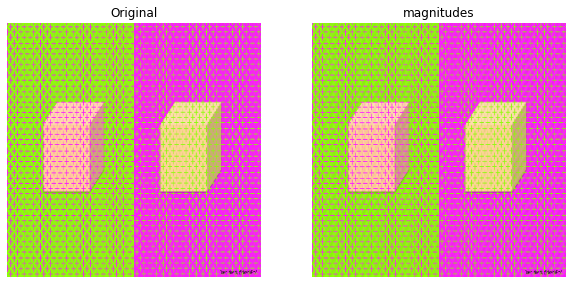

In [515]:
color_spaces = ['YCbCr'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[11:12]):
        img = cv2.resize(img, (300, 300))
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        for channel in channels:
            points = []
            magnitude_spectrum, mag = fourier_transform(channel)
            select_noises(magnitude_spectrum, names[i + 3], points)
            filtered = bandpass_filtering(mag, points)
            backed_img = inverse_fourier_transform(filtered)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, points)
            magnitudes.append(backed_img)
            filtered_show.append(filtered_to_show)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

| Color Space: HSV-------------------------------------------------------------------------------------------------

   |_ image: cagi_1


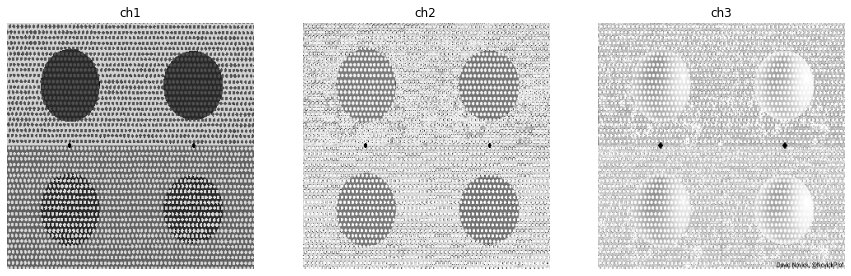

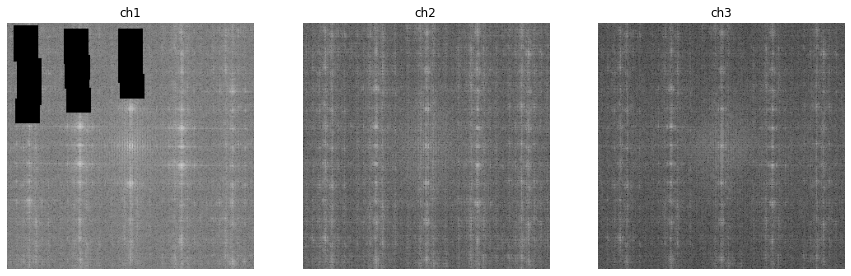

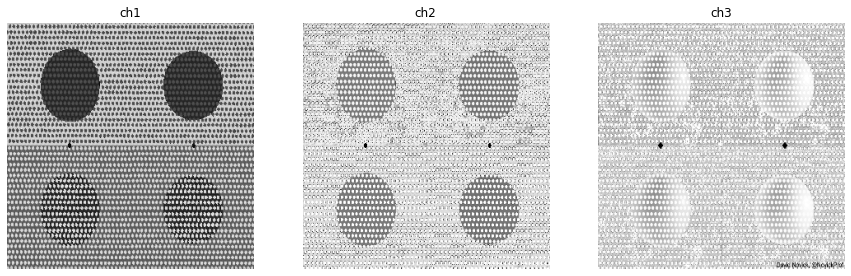

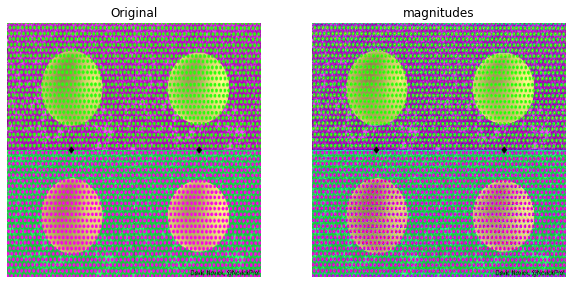

In [466]:
color_spaces = ['HSV'] #'RGB', 'HSV', 'YCbCr', 
for color_space in color_spaces:
    print('| Color Space: {:-<100}\n'.format(color_space))
    for i, img in enumerate(images[8:9]):
        img = cv2.resize(img, (300, 300))
        
        new_img = convert_color_space(img, color_space, dst=None)
        
        print('   |_ image: {}'.format(names[i + 3]))
        channels = [new_img[:, :, 0], new_img[:, :, 1], new_img[:, :, 2]]
        plotter(channels, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        magnitudes = []
        filtered_show = []
        for channel in channels:
            points = []
            magnitude_spectrum, mag = fourier_transform(channel)
            select_noises(magnitude_spectrum, names[i + 3], points)
            filtered = bandpass_filtering(mag, points)
            backed_img = inverse_fourier_transform(filtered)
            filtered_to_show = bandpass_filtering(magnitude_spectrum, points)
            magnitudes.append(backed_img)
            filtered_show.append(filtered_to_show)
        plotter(filtered_show, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        plotter(magnitudes, ['ch1', 'ch2', 'ch3'], subplots=(1, 3), gray=True)
        
        merge = cv2.merge([magnitudes[0], magnitudes[1], magnitudes[2]])
        backed = convert_color_space(merge, color_space, dst='rgb')

        plotter([img, backed.astype(np.uint8)], names=['Original', 'magnitudes'], subplots=(1, 2))

In [244]:
# bird: thresholds = [100000, 100000, 60000]
# camera man: thresholds = [270000, 350000, 390000]

